In [7]:
from google.colab import files

# Upload the zip file
uploaded = files.upload()


In [8]:
import torch
from torch.utils.data import Dataset, DataLoader
import torchaudio

class SpeechDataset(Dataset):
    def __init__(self, noisy_files, clean_files, transform=None, fixed_length=16000):
        self.noisy_files = noisy_files
        self.clean_files = clean_files
        self.transform = transform
        self.fixed_length = fixed_length

    def __len__(self):
        return len(self.noisy_files)

    def __getitem__(self, idx):
        noisy_file = self.noisy_files[idx]
        clean_file = self.clean_files[idx]

        noisy_waveform, _ = torchaudio.load(noisy_file)
        clean_waveform, _ = torchaudio.load(clean_file)

        noisy_waveform = self.pad_or_truncate(noisy_waveform)
        clean_waveform = self.pad_or_truncate(clean_waveform)

        if self.transform:
            noisy_waveform = self.transform(noisy_waveform)
            clean_waveform = self.transform(clean_waveform)

        return noisy_waveform, clean_waveform

    def pad_or_truncate(self, waveform):
        if waveform.size(1) > self.fixed_length:
            return waveform[:, :self.fixed_length]
        elif waveform.size(1) < self.fixed_length:
            padding = self.fixed_length - waveform.size(1)
            return torch.nn.functional.pad(waveform, (0, padding))
        else:
            return waveform


In [9]:
# Define paths to your datasets
import os
train_noisy_files = [os.path.join('/content/SEGAN_Model/SEGAN_sound_dataset/noisy_trainset_28spk_wav', f) for f in os.listdir('/content/SEGAN_Model/SEGAN_sound_dataset/noisy_trainset_28spk_wav')]
train_clean_files = [os.path.join('/content/SEGAN_Model/SEGAN_sound_dataset/clean_trainset_new', f) for f in os.listdir('/content/SEGAN_Model/SEGAN_sound_dataset/clean_trainset_new')]

test_noisy_files = [os.path.join('/content/SEGAN_Model/SEGAN_sound_dataset/noisy_testset_wav', f) for f in os.listdir('/content/SEGAN_Model/SEGAN_sound_dataset/noisy_testset_wav')]
test_clean_files = [os.path.join('/content/SEGAN_Model/SEGAN_sound_dataset/Clean_testset_new', f) for f in os.listdir('/content/SEGAN_Model/SEGAN_sound_dataset/Clean_testset_new')]

# Create the train dataset and dataloader
train_dataset = SpeechDataset(train_noisy_files, train_clean_files)
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)

# Create the test dataset and dataloader
test_dataset = SpeechDataset(test_noisy_files, test_clean_files)
test_dataloader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4)



/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [10]:
import torch.nn as nn

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        # Define the layers of the generator
        self.conv1 = nn.Conv1d(1, 16, kernel_size=25, stride=1, padding=12)
        self.conv2 = nn.Conv1d(16, 32, kernel_size=25, stride=2, padding=12)
        self.deconv1 = nn.ConvTranspose1d(32, 16, kernel_size=25, stride=2, padding=12, output_padding=1)
        self.deconv2 = nn.ConvTranspose1d(16, 1, kernel_size=25, stride=1, padding=12)

    def forward(self, x):
        x = torch.relu(self.conv1(x))
        x = torch.relu(self.conv2(x))
        x = torch.relu(self.deconv1(x))
        x = torch.tanh(self.deconv2(x))
        return x


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.conv1 = nn.Conv1d(1, 16, kernel_size=25, stride=2, padding=12)
        self.conv2 = nn.Conv1d(16, 32, kernel_size=25, stride=2, padding=12)
        self.conv3 = nn.Conv1d(32, 64, kernel_size=25, stride=2, padding=12)

        # Assuming fixed_length=16000, calculate the output size after conv layers
        conv_output_size = self.calculate_conv_output_size(16000)

        self.fc1 = nn.Linear(conv_output_size * 64, 1)

    def calculate_conv_output_size(self, input_size):
        # Function to calculate the output size after each conv layer
        size = input_size
        size = (size + 2*12 - 25) // 2 + 1  # conv1
        size = (size + 2*12 - 25) // 2 + 1  # conv2
        size = (size + 2*12 - 25) // 2 + 1  # conv3
        return size

    def forward(self, x):
        x = torch.relu(self.conv1(x))
        x = torch.relu(self.conv2(x))
        x = torch.relu(self.conv3(x))
        x = x.view(x.size(0), -1)  # Flatten the tensor
        x = torch.sigmoid(self.fc1(x))
        return x



In [11]:
import torch.optim as optim
import torch.nn.functional as F

def train_segan(generator, discriminator, dataloader, num_epochs=100, learning_rate=0.0002):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    generator.to(device)
    discriminator.to(device)

    criterion = nn.BCELoss()
    optimizer_G = optim.Adam(generator.parameters(), lr=learning_rate, betas=(0.5, 0.999))
    optimizer_D = optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(0.5, 0.999))

    for epoch in range(num_epochs):
        for i, (noisy_speech, clean_speech) in enumerate(dataloader):
            noisy_speech = noisy_speech.to(device)
            clean_speech = clean_speech.to(device)

            valid = torch.ones(noisy_speech.size(0), 1).to(device)
            fake = torch.zeros(noisy_speech.size(0), 1).to(device)

            # Train Generator
            optimizer_G.zero_grad()
            gen_speech = generator(noisy_speech)
            g_loss = criterion(discriminator(gen_speech), valid)
            g_loss.backward()
            optimizer_G.step()

            # Train Discriminator
            optimizer_D.zero_grad()
            real_loss = criterion(discriminator(clean_speech), valid)
            fake_loss = criterion(discriminator(gen_speech.detach()), fake)
            d_loss = (real_loss + fake_loss) / 2
            d_loss.backward()
            optimizer_D.step()

            print(f"[Epoch {epoch}/{num_epochs}] [Batch {i}/{len(dataloader)}] [D loss: {d_loss.item()}] [G loss: {g_loss.item()}]")

# Train the model
generator = Generator()
discriminator = Discriminator()
train_segan(generator, discriminator, train_dataloader)


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[Epoch 0/100] [Batch 0/4] [D loss: 0.6931029558181763] [G loss: 0.6913046836853027]
[Epoch 0/100] [Batch 1/4] [D loss: 0.6893438696861267] [G loss: 0.7317574620246887]
[Epoch 0/100] [Batch 2/4] [D loss: 0.6904810667037964] [G loss: 0.6320656538009644]
[Epoch 0/100] [Batch 3/4] [D loss: 0.692977249622345] [G loss: 0.757023811340332]
[Epoch 1/100] [Batch 0/4] [D loss: 0.6991720199584961] [G loss: 0.6706802248954773]
[Epoch 1/100] [Batch 1/4] [D loss: 0.7064356803894043] [G loss: 0.6635435223579407]
[Epoch 1/100] [Batch 2/4] [D loss: 0.7069447040557861] [G loss: 0.689397931098938]
[Epoch 1/100] [Batch 3/4] [D loss: 0.6997083425521851] [G loss: 0.6870822906494141]
[Epoch 2/100] [Batch 0/4] [D loss: 0.6904125809669495] [G loss: 0.6935003399848938]
[Epoch 2/100] [Batch 1/4] [D loss: 0.6801644563674927] [G loss: 0.7082754373550415]
[Epoch 2/100] [Batch 2/4] [D loss: 0.6657655835151672] [G loss: 0.7092229127883911]
[Epoch 2/100] [Batch 3/4] [D loss: 0.6449006795883179] [G loss: 0.7091884613037

In [12]:
#Save the trained generator model
torch.save(generator.state_dict(), 'generator.pth')
print("Generator model saved as 'generator.pth'")

Generator model saved as 'generator.pth'


Noisy waveform shape: torch.Size([1, 1, 109440])
Cleaned waveform shape: torch.Size([109440])
Playing noisy speech: /content/SEGAN_Model/SEGAN_sound_dataset/noisy_trainset_28spk_wav/p226_001.wav


Playing cleaned speech:


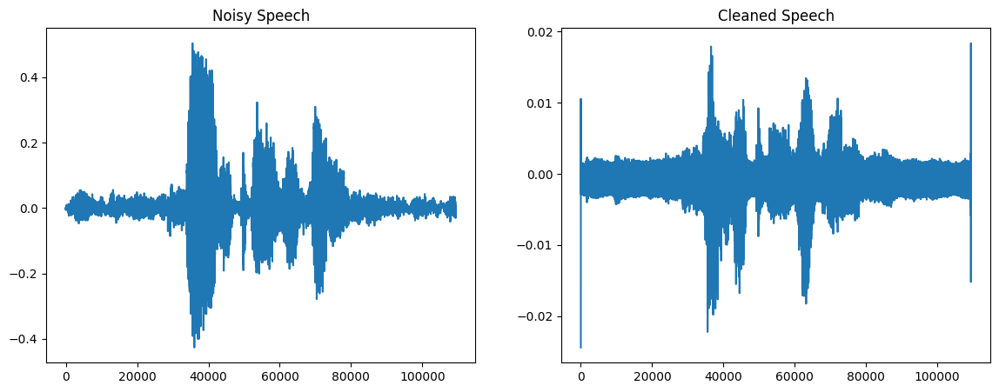

Noisy waveform shape: torch.Size([1, 1, 187200])
Cleaned waveform shape: torch.Size([187200])
Playing noisy speech: /content/SEGAN_Model/SEGAN_sound_dataset/noisy_trainset_28spk_wav/p226_002.wav


Playing cleaned speech:


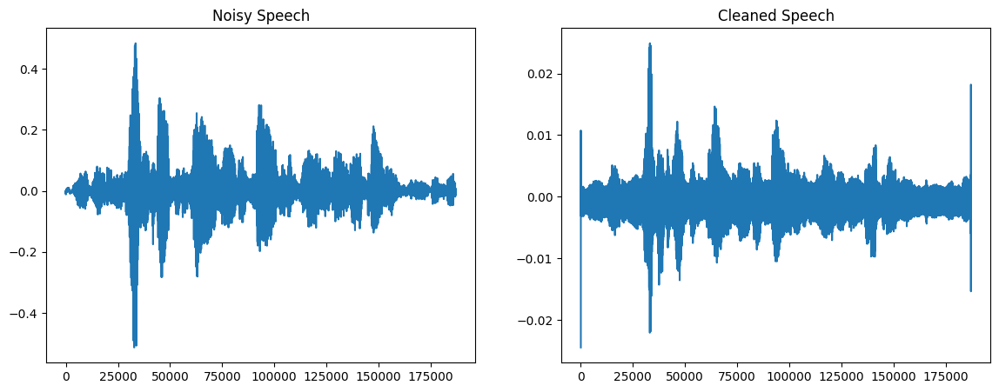

Noisy waveform shape: torch.Size([1, 1, 373167])
Cleaned waveform shape: torch.Size([373168])
Playing noisy speech: /content/SEGAN_Model/SEGAN_sound_dataset/noisy_trainset_28spk_wav/p226_003.wav


Playing cleaned speech:


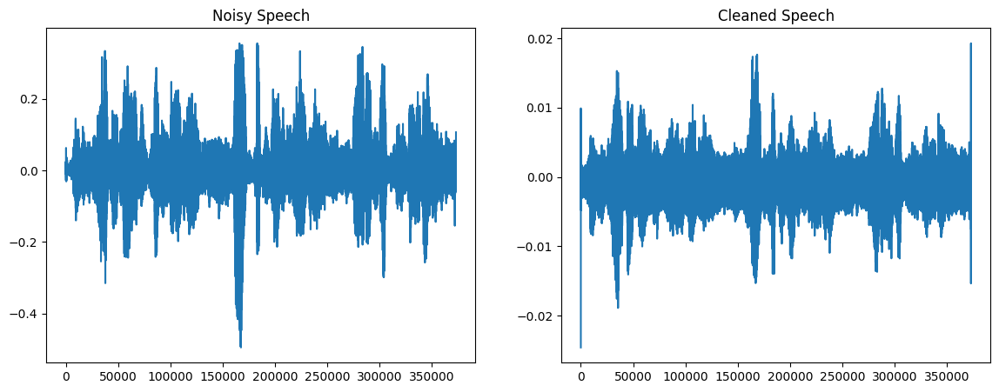

Noisy waveform shape: torch.Size([1, 1, 249120])
Cleaned waveform shape: torch.Size([249120])
Playing noisy speech: /content/SEGAN_Model/SEGAN_sound_dataset/noisy_trainset_28spk_wav/p226_004.wav


Playing cleaned speech:


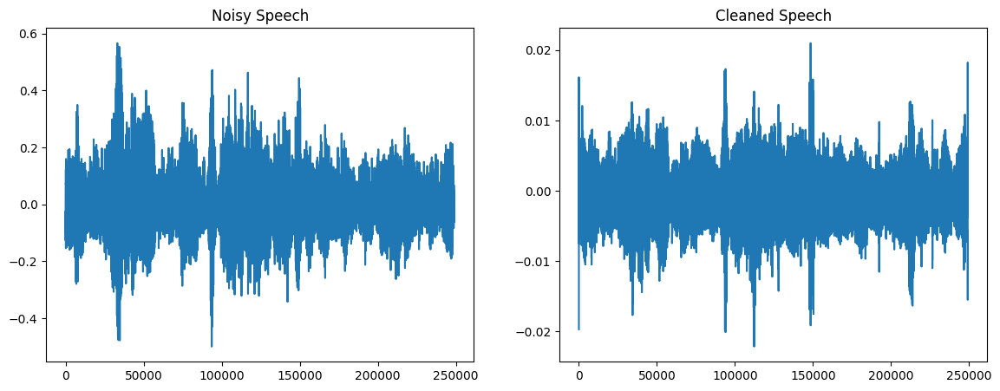

Noisy waveform shape: torch.Size([1, 1, 356206])
Cleaned waveform shape: torch.Size([356206])
Playing noisy speech: /content/SEGAN_Model/SEGAN_sound_dataset/noisy_trainset_28spk_wav/p226_005.wav


Playing cleaned speech:


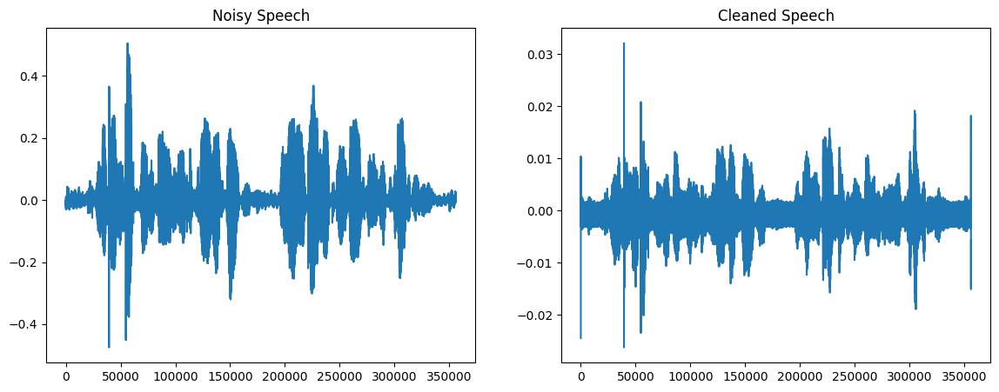

In [14]:
import torch
import torchaudio
import IPython.display as ipd
import matplotlib.pyplot as plt
import torch.nn as nn

# Define the Generator architecture
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.conv1 = nn.Conv1d(1, 16, kernel_size=25, stride=1, padding=12)
        self.conv2 = nn.Conv1d(16, 32, kernel_size=25, stride=2, padding=12)
        self.deconv1 = nn.ConvTranspose1d(32, 16, kernel_size=25, stride=2, padding=12, output_padding=1)
        self.deconv2 = nn.ConvTranspose1d(16, 1, kernel_size=25, stride=1, padding=12)

    def forward(self, x):
        x = torch.relu(self.conv1(x))
        x = torch.relu(self.conv2(x))
        x = torch.relu(self.deconv1(x))
        x = torch.tanh(self.deconv2(x))
        return x

# Load trained generator model
generator = Generator()
generator.load_state_dict(torch.load('generator.pth'))
generator.eval()

# Function to load and process speech file
def load_speech(file_path):
    waveform, sample_rate = torchaudio.load(file_path)
    return waveform, sample_rate

# List of file paths to noisy speech samples
noisy_speech_files = [
    '/content/SEGAN_Model/SEGAN_sound_dataset/noisy_trainset_28spk_wav/p226_001.wav',
    '/content/SEGAN_Model/SEGAN_sound_dataset/noisy_trainset_28spk_wav/p226_002.wav',
    '/content/SEGAN_Model/SEGAN_sound_dataset/noisy_trainset_28spk_wav/p226_003.wav',
    '/content/SEGAN_Model/SEGAN_sound_dataset/noisy_trainset_28spk_wav/p226_004.wav',
    '/content/SEGAN_Model/SEGAN_sound_dataset/noisy_trainset_28spk_wav/p226_005.wav'
]

# Process and play each noisy speech file
for file_path in noisy_speech_files:
    noisy_waveform, sample_rate = load_speech(file_path)

    # Normalize and prepare the input tensor
    noisy_waveform = noisy_waveform.unsqueeze(0)  # Add batch dimension
    noisy_waveform = noisy_waveform.to(torch.float32)

    print(f"Noisy waveform shape: {noisy_waveform.shape}")

    # Generate cleaned speech
    with torch.no_grad():
        cleaned_waveform = generator(noisy_waveform)

    # Remove batch dimension and channel dimension
    cleaned_waveform = cleaned_waveform.squeeze(0).squeeze(0)

    print(f"Cleaned waveform shape: {cleaned_waveform.shape}")

    # Play the original noisy speech
    print(f"Playing noisy speech: {file_path}")
    ipd.display(ipd.Audio(noisy_waveform.squeeze().numpy(), rate=sample_rate))

    # Play the cleaned speech
    print("Playing cleaned speech:")
    ipd.display(ipd.Audio(cleaned_waveform.numpy(), rate=sample_rate))

    # Plot waveforms for comparison
    plt.figure(figsize=(14, 5))
    plt.subplot(1, 2, 1)
    plt.title('Noisy Speech')
    plt.plot(noisy_waveform.squeeze().numpy())
    plt.subplot(1, 2, 2)
    plt.title('Cleaned Speech')
    plt.plot(cleaned_waveform.numpy())
    plt.show()


Noisy waveform shape: torch.Size([1, 1, 83582])
Cleaned waveform shape: torch.Size([83582])
Noisy waveform min/max: -0.51470947265625/0.455902099609375
Cleaned waveform min/max: -0.02468845434486866/0.01962805725634098
Playing noisy speech: /content/SEGAN_Model/SEGAN_sound_dataset/noisy_testset_wav/p232_001.wav


Playing cleaned speech:


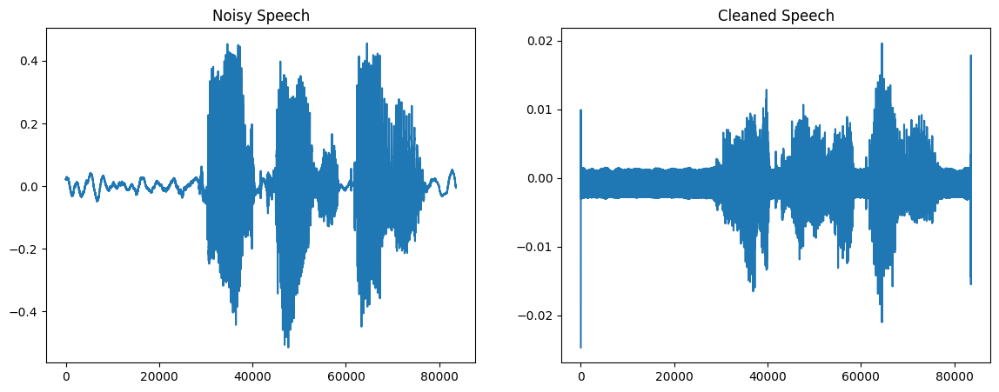

Noisy waveform shape: torch.Size([1, 1, 130330])
Cleaned waveform shape: torch.Size([130330])
Noisy waveform min/max: -0.500030517578125/0.529388427734375
Cleaned waveform min/max: -0.024659529328346252/0.01902395486831665
Playing noisy speech: /content/SEGAN_Model/SEGAN_sound_dataset/noisy_testset_wav/p232_002.wav


Playing cleaned speech:


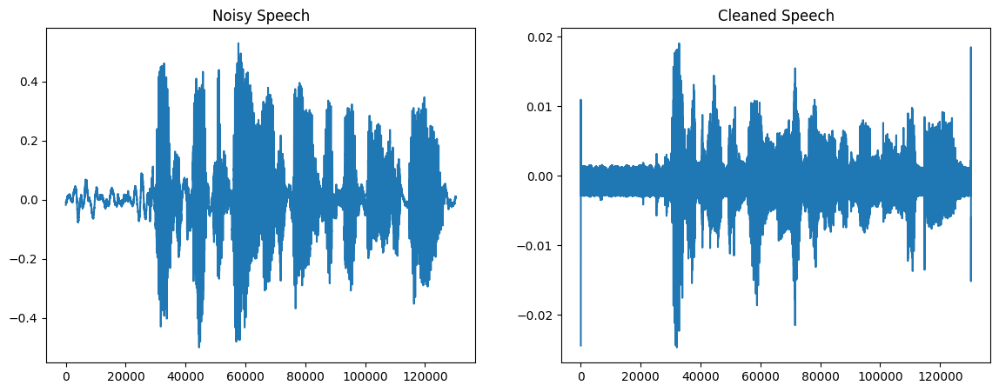

Noisy waveform shape: torch.Size([1, 1, 344873])
Cleaned waveform shape: torch.Size([344874])
Noisy waveform min/max: -0.461090087890625/0.5592041015625
Cleaned waveform min/max: -0.02456575632095337/0.016320187598466873
Playing noisy speech: /content/SEGAN_Model/SEGAN_sound_dataset/noisy_testset_wav/p232_003.wav


Playing cleaned speech:


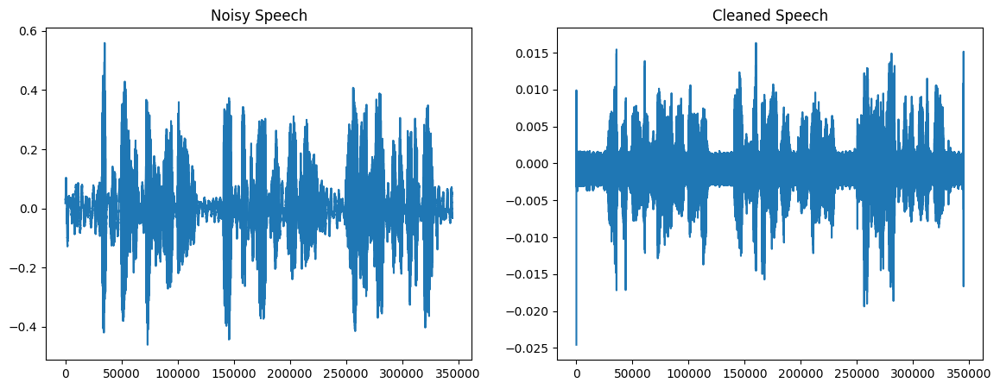

In [21]:
import torch
import torchaudio
import IPython.display as ipd
import matplotlib.pyplot as plt
import torch.nn as nn

# Define the Generator class
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.conv1 = nn.Conv1d(1, 16, kernel_size=25, stride=1, padding=12)
        self.conv2 = nn.Conv1d(16, 32, kernel_size=25, stride=2, padding=12)
        self.deconv1 = nn.ConvTranspose1d(32, 16, kernel_size=25, stride=2, padding=12, output_padding=1)
        self.deconv2 = nn.ConvTranspose1d(16, 1, kernel_size=25, stride=1, padding=12)

    def forward(self, x):
        x = torch.relu(self.conv1(x))
        x = torch.relu(self.conv2(x))
        x = torch.relu(self.deconv1(x))
        x = torch.tanh(self.deconv2(x))
        return x

# Load trained generator model
generator = Generator()
generator.load_state_dict(torch.load('generator.pth'))
generator.eval()

# Function to load and process speech file
def load_speech(file_path):
    waveform, sample_rate = torchaudio.load(file_path)
    return waveform, sample_rate

# List of file paths to noisy speech samples from the test set
noisy_speech_files = [
    '/content/SEGAN_Model/SEGAN_sound_dataset/noisy_testset_wav/p232_001.wav',
    '/content/SEGAN_Model/SEGAN_sound_dataset/noisy_testset_wav/p232_002.wav',
    '/content/SEGAN_Model/SEGAN_sound_dataset/noisy_testset_wav/p232_003.wav',
    #'/content/SEGAN_Model/SEGAN_sound_dataset/noisy_testset_wav/p232_004.wav',
]

# Process and play each noisy speech file
for file_path in noisy_speech_files:
    noisy_waveform, sample_rate = load_speech(file_path)

    # Normalize and prepare the input tensor
    noisy_waveform = noisy_waveform.unsqueeze(0)  # Add batch dimension
    noisy_waveform = noisy_waveform.to(torch.float32)

    # Generate cleaned speech
    with torch.no_grad():
        cleaned_waveform = generator(noisy_waveform)

    # Remove batch dimension
    cleaned_waveform = cleaned_waveform.squeeze(0)

    # Ensure cleaned_waveform has the correct dimensions
    if cleaned_waveform.dim() > 1:
        cleaned_waveform = cleaned_waveform.squeeze(0)

    # Ensure data is in the correct range
    cleaned_waveform = cleaned_waveform.clamp(min=-1, max=1)

    # Debug information
    print(f"Noisy waveform shape: {noisy_waveform.shape}")
    print(f"Cleaned waveform shape: {cleaned_waveform.shape}")
    print(f"Noisy waveform min/max: {noisy_waveform.min()}/{noisy_waveform.max()}")
    print(f"Cleaned waveform min/max: {cleaned_waveform.min()}/{cleaned_waveform.max()}")

    # Play the original noisy speech
    print(f"Playing noisy speech: {file_path}")
    ipd.display(ipd.Audio(noisy_waveform.squeeze().numpy(), rate=sample_rate))

    # Play the cleaned speech
    print("Playing cleaned speech:")
    ipd.display(ipd.Audio(cleaned_waveform.numpy(), rate=sample_rate))

    # Plot waveforms for comparison
    plt.figure(figsize=(14, 5))
    plt.subplot(1, 2, 1)
    plt.title('Noisy Speech')
    plt.plot(noisy_waveform.squeeze().numpy())
    plt.subplot(1, 2, 2)
    plt.title('Cleaned Speech')
    plt.plot(cleaned_waveform.numpy())
    plt.show()
